In [1]:
#Import packages
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
from urllib.request import urlopen
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [2]:
Catalog=pd.read_pickle('Catalog_train.pkl')
Catalog=Catalog.sample(300).reset_index(drop=True)
Catalog_train,Catalog_test,y_train,y_test=train_test_split(Catalog,Catalog.Vangogh,test_size=0.2,stratify=Catalog.Vangogh)
Catalog_train=Catalog_train.reset_index(drop=True)
Catalog_test=Catalog_test.reset_index(drop=True)

In [3]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
face2_cascade=cv2.CascadeClassifier('haarcascade_profileface.xml')
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')

In [15]:
#Finally Let's see some of the pictures.
#taken from https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_matplotlib_rgb_brg_image_load_display_save.php
def plot_image(image,ax):
    b,g,r = cv2.split(image)       # get b,g,r
    rgb_img = cv2.merge([r,g,b])     # switch it to rgb
    
    gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray,1.3,3)
    faces2=face2_cascade.detectMultiScale(gray,1.2,4)
    eyes=eye_cascade.detectMultiScale(gray,1.3,5)
    
    faces=list(faces)+list(faces2)
    #print(len(faces+eyes))
    
    for (x,y,w,h) in faces:
        rgb_img = cv2.rectangle(rgb_img,(x,y),(x+w,y+h),(255,0,0),10)
    for (ex,ey,ew,eh) in eyes:
        rgb_imag=cv2.rectangle(rgb_img,(ex,ey),(ex+ew,ey+eh),(0,255,0),10)
    
    ax.imshow(rgb_img)
    ax.set_xticks([]); ax.set_yticks([])   # to hide tick values on X and Y axis

def get_image(url):
    resp = urlopen(url)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    return image

def extract_faces_eyes(image):
    gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray,1.3,3)
    faces2=face2_cascade.detectMultiScale(gray,1.3,4)
    eyes=eye_cascade.detectMultiScale(gray,1.3,4)
    
    faces=list(faces)+list(faces2)   
    
    if len(faces)>0:  
        sizes_faces=[f[2]*f[3] for f in faces]
        f=faces[np.argmax(sizes_faces)]
        Face_Patch=gray[f[1]:(f[1]+f[3]),f[0]:(f[0]+f[2])]
        Face_Patch=cv2.resize(Face_Patch,(100,100)).ravel()
    else:
        Face_Patch=None
    
    return len(faces),len(eyes), Face_Patch

In [16]:
def show_random_pictures(n,data=Catalog_train,state=561698):
    data=Catalog_train
    urls_vangogh=list(data.loc[data.Vangogh==1,['URL']].sample(n,random_state=state).URL)
    urls_others=list(data.loc[data.Vangogh==0,['URL']].sample(n,random_state=state).URL)
    
    images_vangogh=[]
    for url in urls_vangogh:
        images_vangogh.append(get_image(url))
    
    images_others=[]
    for url in urls_others:
        images_others.append(get_image(url))
    
    fig,axes=plt.subplots(n,2,figsize=(15,8*n))
    axes[0,0].set_title('Van Gogh'); axes[0,1].set_title('Others')
    for i in range(n):
        plot_image(images_vangogh[i],axes[i,0])
        plot_image(images_others[i],axes[i,1])

In [17]:
def add_Faces_Eyes_Catalog(Catalog):
    Catalog['Face_Patch']=0
    Catalog.Face_Patch=Catalog.Face_Patch.astype('object')
    Catalog['No_Faces']=0
    Catalog['No_Eyes']=0
    N=Catalog.shape[0]
    print('Need:', N)
    
    All_No_Faces=[]
    All_No_Eyes=[]
    All_Patches=[]
    for ind in Catalog.index:
        if ind%10==0: print(ind)
        url=Catalog.URL[ind]
        no_faces,no_eyes,face_patch=extract_faces_eyes(get_image(url))
        All_No_Faces.append(no_faces)
        All_No_Eyes.append(no_eyes)
        All_Patches.append(face_patch)
        
    Catalog['No_Faces']=All_No_Faces
    Catalog['No_Eyes']=All_No_Eyes
    Catalog['Face_Patch']=All_Patches
    
    return Catalog    

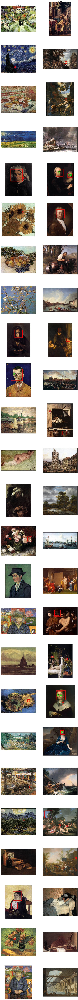

In [20]:
show_random_pictures(25,Catalog_train,state=43205)

In [46]:
#Catalog_train=add_Faces_Eyes_Catalog(Catalog_train)

In [47]:
#Catalog_test=add_Faces_Eyes_Catalog(Catalog_test)

[[],
 Text(0, 0.5, '# Faces'),
 [Text(0, 0, 'Others'), Text(0, 0, 'Van Gogh')],
 Text(0.5, 0, '')]

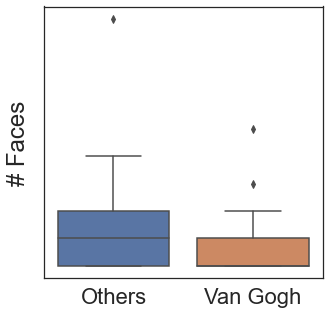

In [48]:
Catalog_train=pd.read_pickle('Catalogs/Catalog_train_w_strokes_and_channels_and_faces_and_hists.pkl')
import seaborn as sns
fig,ax=plt.subplots(figsize=(5,5))
Catalog_test.Vangogh=Catalog_train.Vangogh.astype('category')
sns.set(font_scale=2)
sns.set_style("white")
sns.boxplot(ax=ax,x="Vangogh", y="No_Faces", data=Catalog_test).set(xticklabels=['Others','Van Gogh'],yticklabels=[],ylabel='# Faces',xlabel='')

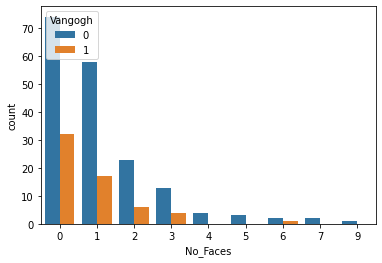

In [19]:
sns.countplot(x="No_Faces", hue="Vangogh", data=Catalog_train)

In [20]:
def print_results(X,y,model,type_data='test'):
    y_pred=model.predict(X)
    M=confusion_matrix(y,y_pred,normalize='true')
    M=pd.DataFrame(M,index=['True Other','True Van Gogh'],columns=['Pred. Other','Pred. Van Gog'])
    display(M.style.format('{:.2%}'))

    print(('Score on '+type_data+' data: {:.2%}').format(model.score(X,y)))

In [22]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier, plot_tree


tree_cl=DecisionTreeClassifier(max_depth=2,class_weight={0:1,1:4})
X_train=Catalog_train[['No_Faces','No_Eyes']]
X_test=Catalog_test[['No_Faces','No_Eyes']]
y_train=Catalog_train.Vangogh
tree_cl.fit(X_train,y_train)

print_results(X_train,y_train,tree_cl,'train')
print_results(X_test,y_test,tree_cl)

,Pred. Other,Pred. Van Gog
True Other,32.78%,67.22%
True Van Gogh,13.33%,86.67%


Score on train data: 46.25%


,Pred. Other,Pred. Van Gog
True Other,37.78%,62.22%
True Van Gogh,6.67%,93.33%


Score on test data: 51.67%


In [46]:
#MLP On the Face_Patch
from sklearn.neural_network import MLPClassifier
mlp=MLPClassifier(hidden_layer_sizes=(50,100,50),max_iter=1000)

Catalog2=Catalog_train.copy()
Catalog2=Catalog2.dropna()

Catalog3=Catalog_test.copy()
Catalog3=Catalog3.dropna()

X_train=np.array(list(Catalog2.Face_Patch))
X_test=np.array(list(Catalog3.Face_Patch))
y_train=Catalog2.Vangogh
y_test=Catalog3.Vangogh

mlp.fit(X_train,y_train)
print_results(X_train,y_train,mlp,'train')
print_results(X_test,y_test,mlp)

,Pred. Other,Pred. Van Gog
True Other,87.74%,12.26%
True Van Gogh,28.57%,71.43%


Score on train data: 84.33%


,Pred. Other,Pred. Van Gog
True Other,88.46%,11.54%
True Van Gogh,60.00%,40.00%


Score on test data: 80.65%
